# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build cnn_bilstm model

In [15]:
cnn_bilstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(50, return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(10)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [16]:
from tensorflow import keras

cnn_bilstm_model.compile(loss='mae', optimizer='adam')

# Train model

In [17]:
history = cnn_bilstm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 81.5644 - val_loss: 74.4844
Epoch 2/2000
10/10 - 0s - loss: 80.1857 - val_loss: 72.7931
Epoch 3/2000
10/10 - 0s - loss: 78.5365 - val_loss: 71.0066
Epoch 4/2000
10/10 - 0s - loss: 76.2968 - val_loss: 68.3814
Epoch 5/2000
10/10 - 0s - loss: 73.5381 - val_loss: 65.1877
Epoch 6/2000
10/10 - 0s - loss: 70.0681 - val_loss: 61.7515
Epoch 7/2000
10/10 - 0s - loss: 66.3694 - val_loss: 58.0432
Epoch 8/2000
10/10 - 0s - loss: 62.6451 - val_loss: 54.2130
Epoch 9/2000
10/10 - 0s - loss: 58.5856 - val_loss: 50.2854
Epoch 10/2000
10/10 - 0s - loss: 54.2596 - val_loss: 46.1582
Epoch 11/2000
10/10 - 0s - loss: 50.0741 - val_loss: 41.8784
Epoch 12/2000
10/10 - 0s - loss: 46.0272 - val_loss: 37.4950
Epoch 13/2000
10/10 - 0s - loss: 41.6409 - val_loss: 33.0996
Epoch 14/2000
10/10 - 0s - loss: 37.2283 - val_loss: 28.7778
Epoch 15/2000
10/10 - 0s - loss: 32.9167 - val_loss: 24.7271
Epoch 16/2000
10/10 - 0s - loss: 29.6017 - val_loss: 21.1608
Epoch 17/2000
10/10 - 0s - loss: 

Epoch 135/2000
10/10 - 0s - loss: 17.2192 - val_loss: 13.8748
Epoch 136/2000
10/10 - 0s - loss: 17.5380 - val_loss: 13.9419
Epoch 137/2000
10/10 - 0s - loss: 17.7152 - val_loss: 13.9338
Epoch 138/2000
10/10 - 0s - loss: 16.9615 - val_loss: 13.9048
Epoch 139/2000
10/10 - 0s - loss: 17.2122 - val_loss: 14.1623
Epoch 140/2000
10/10 - 0s - loss: 17.0171 - val_loss: 14.1081
Epoch 141/2000
10/10 - 0s - loss: 17.3744 - val_loss: 14.5285
Epoch 142/2000
10/10 - 0s - loss: 17.5275 - val_loss: 13.8631
Epoch 143/2000
10/10 - 0s - loss: 17.8194 - val_loss: 13.8653
Epoch 144/2000
10/10 - 0s - loss: 18.3504 - val_loss: 13.8880
Epoch 145/2000
10/10 - 0s - loss: 17.5684 - val_loss: 13.9493
Epoch 146/2000
10/10 - 0s - loss: 17.9309 - val_loss: 13.9242
Epoch 147/2000
10/10 - 0s - loss: 16.7429 - val_loss: 13.9292
Epoch 148/2000
10/10 - 0s - loss: 18.2251 - val_loss: 14.0334
Epoch 149/2000
10/10 - 0s - loss: 17.9943 - val_loss: 14.4593
Epoch 150/2000
10/10 - 0s - loss: 17.2277 - val_loss: 14.0148
Epoch 15

Epoch 268/2000
10/10 - 0s - loss: 17.4725 - val_loss: 13.9936
Epoch 269/2000
10/10 - 0s - loss: 17.0216 - val_loss: 13.9699
Epoch 270/2000
10/10 - 0s - loss: 16.5917 - val_loss: 13.8370
Epoch 271/2000
10/10 - 0s - loss: 17.9120 - val_loss: 13.9933
Epoch 272/2000
10/10 - 0s - loss: 16.5039 - val_loss: 14.0774
Epoch 273/2000
10/10 - 0s - loss: 16.3138 - val_loss: 14.8019
Epoch 274/2000
10/10 - 0s - loss: 16.3420 - val_loss: 14.6414
Epoch 275/2000
10/10 - 0s - loss: 16.6725 - val_loss: 14.2504
Epoch 276/2000
10/10 - 0s - loss: 17.5094 - val_loss: 14.1679
Epoch 277/2000
10/10 - 0s - loss: 16.3005 - val_loss: 13.9289
Epoch 278/2000
10/10 - 0s - loss: 17.3814 - val_loss: 13.7988
Epoch 279/2000
10/10 - 0s - loss: 17.7782 - val_loss: 13.7867
Epoch 280/2000
10/10 - 0s - loss: 17.9789 - val_loss: 13.9355
Epoch 281/2000
10/10 - 0s - loss: 16.5180 - val_loss: 14.0403
Epoch 282/2000
10/10 - 0s - loss: 16.6086 - val_loss: 14.1018
Epoch 283/2000
10/10 - 0s - loss: 16.6530 - val_loss: 14.1395
Epoch 28

Epoch 401/2000
10/10 - 0s - loss: 17.7323 - val_loss: 13.8809
Epoch 402/2000
10/10 - 0s - loss: 16.6665 - val_loss: 13.9678
Epoch 403/2000
10/10 - 0s - loss: 16.1203 - val_loss: 13.9136
Epoch 404/2000
10/10 - 0s - loss: 16.6982 - val_loss: 13.9950
Epoch 405/2000
10/10 - 0s - loss: 16.8763 - val_loss: 13.9326
Epoch 406/2000
10/10 - 0s - loss: 17.1974 - val_loss: 13.9450
Epoch 407/2000
10/10 - 0s - loss: 17.5637 - val_loss: 14.0297
Epoch 408/2000
10/10 - 0s - loss: 16.3244 - val_loss: 14.1345
Epoch 409/2000
10/10 - 0s - loss: 16.7643 - val_loss: 13.9143
Epoch 410/2000
10/10 - 0s - loss: 17.4563 - val_loss: 14.2415
Epoch 411/2000
10/10 - 0s - loss: 16.4834 - val_loss: 14.7676
Epoch 412/2000
10/10 - 0s - loss: 15.5470 - val_loss: 15.2182
Epoch 413/2000
10/10 - 0s - loss: 16.2437 - val_loss: 14.7700
Epoch 414/2000
10/10 - 0s - loss: 16.8692 - val_loss: 13.8491
Epoch 415/2000
10/10 - 0s - loss: 17.0543 - val_loss: 13.9411
Epoch 416/2000
10/10 - 0s - loss: 16.4465 - val_loss: 13.9860
Epoch 41

Epoch 534/2000
10/10 - 0s - loss: 16.6324 - val_loss: 13.9467
Epoch 535/2000
10/10 - 0s - loss: 15.7726 - val_loss: 13.7858
Epoch 536/2000
10/10 - 0s - loss: 15.4475 - val_loss: 13.9321
Epoch 537/2000
10/10 - 0s - loss: 15.4705 - val_loss: 14.1230
Epoch 538/2000
10/10 - 0s - loss: 15.9327 - val_loss: 14.2236
Epoch 539/2000
10/10 - 0s - loss: 15.7681 - val_loss: 14.1645
Epoch 540/2000
10/10 - 0s - loss: 15.3133 - val_loss: 14.1180
Epoch 541/2000
10/10 - 0s - loss: 15.3950 - val_loss: 14.0766
Epoch 542/2000
10/10 - 0s - loss: 14.4182 - val_loss: 13.9977
Epoch 543/2000
10/10 - 0s - loss: 15.0184 - val_loss: 14.0348
Epoch 544/2000
10/10 - 0s - loss: 14.8391 - val_loss: 14.1134
Epoch 545/2000
10/10 - 0s - loss: 15.1861 - val_loss: 14.9766
Epoch 546/2000
10/10 - 0s - loss: 14.2462 - val_loss: 14.6085
Epoch 547/2000
10/10 - 0s - loss: 15.9555 - val_loss: 14.2076
Epoch 548/2000
10/10 - 0s - loss: 16.0748 - val_loss: 14.5734
Epoch 549/2000
10/10 - 0s - loss: 15.7019 - val_loss: 14.3270
Epoch 55

Epoch 667/2000
10/10 - 0s - loss: 13.2248 - val_loss: 14.9897
Epoch 668/2000
10/10 - 0s - loss: 14.1619 - val_loss: 14.8016
Epoch 669/2000
10/10 - 0s - loss: 13.7078 - val_loss: 14.0224
Epoch 670/2000
10/10 - 0s - loss: 14.2898 - val_loss: 14.0474
Epoch 671/2000
10/10 - 0s - loss: 14.5398 - val_loss: 14.2672
Epoch 672/2000
10/10 - 0s - loss: 14.4866 - val_loss: 13.9034
Epoch 673/2000
10/10 - 0s - loss: 12.9759 - val_loss: 13.8402
Epoch 674/2000
10/10 - 0s - loss: 14.3846 - val_loss: 14.1633
Epoch 675/2000
10/10 - 0s - loss: 13.5897 - val_loss: 14.1501
Epoch 676/2000
10/10 - 0s - loss: 15.3668 - val_loss: 13.9122
Epoch 677/2000
10/10 - 0s - loss: 15.1517 - val_loss: 14.0152
Epoch 678/2000
10/10 - 0s - loss: 14.5391 - val_loss: 13.9332
Epoch 679/2000
10/10 - 0s - loss: 13.4424 - val_loss: 13.8328
Epoch 680/2000
10/10 - 0s - loss: 14.0492 - val_loss: 13.8434
Epoch 681/2000
10/10 - 0s - loss: 14.4723 - val_loss: 13.9334
Epoch 682/2000
10/10 - 0s - loss: 13.6154 - val_loss: 13.9890
Epoch 68

Epoch 800/2000
10/10 - 0s - loss: 11.3109 - val_loss: 14.2197
Epoch 801/2000
10/10 - 0s - loss: 12.0601 - val_loss: 13.7697
Epoch 802/2000
10/10 - 0s - loss: 12.1272 - val_loss: 13.8821
Epoch 803/2000
10/10 - 0s - loss: 12.2915 - val_loss: 14.1655
Epoch 804/2000
10/10 - 0s - loss: 11.9832 - val_loss: 14.2847
Epoch 805/2000
10/10 - 0s - loss: 11.4497 - val_loss: 14.7233
Epoch 806/2000
10/10 - 0s - loss: 11.1796 - val_loss: 15.1537
Epoch 807/2000
10/10 - 0s - loss: 11.2293 - val_loss: 13.6048
Epoch 808/2000
10/10 - 0s - loss: 11.1474 - val_loss: 13.9017
Epoch 809/2000
10/10 - 0s - loss: 11.4497 - val_loss: 14.3509
Epoch 810/2000
10/10 - 0s - loss: 11.6692 - val_loss: 15.6932
Epoch 811/2000
10/10 - 0s - loss: 11.8517 - val_loss: 15.7196
Epoch 812/2000
10/10 - 0s - loss: 12.9063 - val_loss: 13.7075
Epoch 813/2000
10/10 - 0s - loss: 12.1042 - val_loss: 13.0245
Epoch 814/2000
10/10 - 0s - loss: 11.7327 - val_loss: 13.3726
Epoch 815/2000
10/10 - 0s - loss: 12.4014 - val_loss: 14.4710
Epoch 81

10/10 - 0s - loss: 10.8055 - val_loss: 14.1769
Epoch 933/2000
10/10 - 0s - loss: 10.7339 - val_loss: 15.8165
Epoch 934/2000
10/10 - 0s - loss: 10.2589 - val_loss: 14.9554
Epoch 935/2000
10/10 - 0s - loss: 9.5318 - val_loss: 15.4993
Epoch 936/2000
10/10 - 0s - loss: 11.0428 - val_loss: 12.4239
Epoch 937/2000
10/10 - 0s - loss: 9.7141 - val_loss: 13.5963
Epoch 938/2000
10/10 - 0s - loss: 10.7579 - val_loss: 14.2175
Epoch 939/2000
10/10 - 0s - loss: 10.4126 - val_loss: 14.0190
Epoch 940/2000
10/10 - 0s - loss: 10.6387 - val_loss: 14.3952
Epoch 941/2000
10/10 - 0s - loss: 10.0162 - val_loss: 14.4751
Epoch 942/2000
10/10 - 0s - loss: 10.4355 - val_loss: 14.6799
Epoch 943/2000
10/10 - 0s - loss: 10.7218 - val_loss: 14.8247
Epoch 944/2000
10/10 - 0s - loss: 10.6948 - val_loss: 14.7303
Epoch 945/2000
10/10 - 0s - loss: 10.7080 - val_loss: 14.1176
Epoch 946/2000
10/10 - 0s - loss: 10.3475 - val_loss: 13.9507
Epoch 947/2000
10/10 - 0s - loss: 10.7435 - val_loss: 14.1626
Epoch 948/2000
10/10 - 0s

Epoch 1065/2000
10/10 - 0s - loss: 9.0664 - val_loss: 14.8178
Epoch 1066/2000
10/10 - 0s - loss: 9.7478 - val_loss: 14.5017
Epoch 1067/2000
10/10 - 0s - loss: 9.6698 - val_loss: 13.7763
Epoch 1068/2000
10/10 - 0s - loss: 9.2089 - val_loss: 17.6849
Epoch 1069/2000
10/10 - 0s - loss: 9.9896 - val_loss: 16.4142
Epoch 1070/2000
10/10 - 0s - loss: 9.3628 - val_loss: 15.4619
Epoch 1071/2000
10/10 - 0s - loss: 9.2962 - val_loss: 13.6037
Epoch 1072/2000
10/10 - 0s - loss: 8.9164 - val_loss: 15.1121
Epoch 1073/2000
10/10 - 0s - loss: 8.7696 - val_loss: 15.8526
Epoch 1074/2000
10/10 - 0s - loss: 8.8804 - val_loss: 15.8223
Epoch 1075/2000
10/10 - 0s - loss: 9.1730 - val_loss: 15.9121
Epoch 1076/2000
10/10 - 0s - loss: 9.6579 - val_loss: 16.0734
Epoch 1077/2000
10/10 - 0s - loss: 9.6925 - val_loss: 15.2439
Epoch 1078/2000
10/10 - 0s - loss: 9.0141 - val_loss: 15.4925
Epoch 1079/2000
10/10 - 0s - loss: 10.6558 - val_loss: 12.9762
Epoch 1080/2000
10/10 - 0s - loss: 8.9645 - val_loss: 15.9993
Epoch 1

Epoch 1198/2000
10/10 - 0s - loss: 8.7407 - val_loss: 13.2418
Epoch 1199/2000
10/10 - 0s - loss: 11.7090 - val_loss: 12.6124
Epoch 1200/2000
10/10 - 0s - loss: 8.3603 - val_loss: 12.7257
Epoch 1201/2000
10/10 - 0s - loss: 8.5982 - val_loss: 12.4293
Epoch 1202/2000
10/10 - 0s - loss: 8.8670 - val_loss: 12.2509
Epoch 1203/2000
10/10 - 0s - loss: 8.6272 - val_loss: 12.7409
Epoch 1204/2000
10/10 - 0s - loss: 9.1354 - val_loss: 12.8433
Epoch 1205/2000
10/10 - 0s - loss: 8.7991 - val_loss: 12.7907
Epoch 1206/2000
10/10 - 0s - loss: 9.3513 - val_loss: 12.8143
Epoch 1207/2000
10/10 - 0s - loss: 9.2368 - val_loss: 14.1477
Epoch 1208/2000
10/10 - 0s - loss: 9.7911 - val_loss: 13.4093
Epoch 1209/2000
10/10 - 0s - loss: 9.4272 - val_loss: 13.5180
Epoch 1210/2000
10/10 - 0s - loss: 8.5459 - val_loss: 14.0088
Epoch 1211/2000
10/10 - 0s - loss: 8.9564 - val_loss: 13.5750
Epoch 1212/2000
10/10 - 0s - loss: 8.7767 - val_loss: 13.5833
Epoch 1213/2000
10/10 - 0s - loss: 8.8823 - val_loss: 13.5185
Epoch 1

10/10 - 0s - loss: 9.3672 - val_loss: 13.2466
Epoch 1331/2000
10/10 - 0s - loss: 8.8516 - val_loss: 13.1250
Epoch 1332/2000
10/10 - 0s - loss: 8.8826 - val_loss: 13.5599
Epoch 1333/2000
10/10 - 0s - loss: 9.2218 - val_loss: 13.0908
Epoch 1334/2000
10/10 - 0s - loss: 10.1111 - val_loss: 12.8385
Epoch 1335/2000
10/10 - 0s - loss: 9.4183 - val_loss: 12.8537
Epoch 1336/2000
10/10 - 0s - loss: 9.2139 - val_loss: 12.9154
Epoch 1337/2000
10/10 - 0s - loss: 8.7040 - val_loss: 13.2819
Epoch 1338/2000
10/10 - 0s - loss: 9.1741 - val_loss: 12.8312
Epoch 1339/2000
10/10 - 0s - loss: 9.7548 - val_loss: 12.4834
Epoch 1340/2000
10/10 - 0s - loss: 8.9230 - val_loss: 13.2105
Epoch 1341/2000
10/10 - 0s - loss: 9.5661 - val_loss: 13.0385
Epoch 1342/2000
10/10 - 0s - loss: 9.8235 - val_loss: 12.9164
Epoch 1343/2000
10/10 - 0s - loss: 8.9582 - val_loss: 12.9904
Epoch 1344/2000
10/10 - 0s - loss: 8.8933 - val_loss: 13.3120
Epoch 1345/2000
10/10 - 0s - loss: 9.5248 - val_loss: 12.3986
Epoch 1346/2000
10/10 -

Epoch 1463/2000
10/10 - 0s - loss: 8.6256 - val_loss: 13.2108
Epoch 1464/2000
10/10 - 0s - loss: 8.1987 - val_loss: 12.9254
Epoch 1465/2000
10/10 - 0s - loss: 7.9946 - val_loss: 13.2758
Epoch 1466/2000
10/10 - 0s - loss: 7.9919 - val_loss: 13.5531
Epoch 1467/2000
10/10 - 0s - loss: 8.0164 - val_loss: 13.3667
Epoch 1468/2000
10/10 - 0s - loss: 8.1158 - val_loss: 13.2149
Epoch 1469/2000
10/10 - 0s - loss: 8.0886 - val_loss: 13.0003
Epoch 1470/2000
10/10 - 0s - loss: 8.1310 - val_loss: 12.9730
Epoch 1471/2000
10/10 - 0s - loss: 8.0738 - val_loss: 13.0626
Epoch 1472/2000
10/10 - 0s - loss: 7.9091 - val_loss: 13.2789
Epoch 1473/2000
10/10 - 0s - loss: 8.3645 - val_loss: 12.8373
Epoch 1474/2000
10/10 - 0s - loss: 8.1905 - val_loss: 12.9677
Epoch 1475/2000
10/10 - 0s - loss: 8.5714 - val_loss: 13.4786
Epoch 1476/2000
10/10 - 0s - loss: 7.9635 - val_loss: 12.9959
Epoch 1477/2000
10/10 - 0s - loss: 8.2823 - val_loss: 12.8784
Epoch 1478/2000
10/10 - 0s - loss: 8.3699 - val_loss: 13.5803
Epoch 14

Epoch 1596/2000
10/10 - 0s - loss: 8.8690 - val_loss: 14.5857
Epoch 1597/2000
10/10 - 0s - loss: 8.2867 - val_loss: 13.6821
Epoch 1598/2000
10/10 - 0s - loss: 8.7234 - val_loss: 14.0379
Epoch 1599/2000
10/10 - 0s - loss: 8.7129 - val_loss: 18.7284
Epoch 1600/2000
10/10 - 0s - loss: 8.3832 - val_loss: 21.2161
Epoch 1601/2000
10/10 - 0s - loss: 8.2882 - val_loss: 20.6688
Epoch 1602/2000
10/10 - 0s - loss: 8.9855 - val_loss: 17.4005
Epoch 1603/2000
10/10 - 0s - loss: 8.1822 - val_loss: 15.0743
Epoch 1604/2000
10/10 - 0s - loss: 8.3143 - val_loss: 14.0064
Epoch 1605/2000
10/10 - 0s - loss: 8.3516 - val_loss: 12.5260
Epoch 1606/2000
10/10 - 0s - loss: 7.6519 - val_loss: 13.1350
Epoch 1607/2000
10/10 - 0s - loss: 7.8657 - val_loss: 14.6797
Epoch 1608/2000
10/10 - 0s - loss: 8.3801 - val_loss: 16.0897
Epoch 1609/2000
10/10 - 0s - loss: 8.0133 - val_loss: 15.5938
Epoch 1610/2000
10/10 - 0s - loss: 8.3539 - val_loss: 12.3968
Epoch 1611/2000
10/10 - 0s - loss: 7.9998 - val_loss: 13.1752
Epoch 16

Epoch 1729/2000
10/10 - 0s - loss: 8.3079 - val_loss: 13.5971
Epoch 1730/2000
10/10 - 0s - loss: 8.2703 - val_loss: 13.6735
Epoch 1731/2000
10/10 - 0s - loss: 8.2857 - val_loss: 13.8059
Epoch 1732/2000
10/10 - 0s - loss: 8.1489 - val_loss: 15.5121
Epoch 1733/2000
10/10 - 0s - loss: 8.3253 - val_loss: 14.2542
Epoch 1734/2000
10/10 - 0s - loss: 8.2531 - val_loss: 13.8339
Epoch 1735/2000
10/10 - 0s - loss: 7.8651 - val_loss: 14.5770
Epoch 1736/2000
10/10 - 0s - loss: 8.5887 - val_loss: 13.4482
Epoch 1737/2000
10/10 - 0s - loss: 8.4438 - val_loss: 13.4875
Epoch 1738/2000
10/10 - 0s - loss: 8.3734 - val_loss: 13.6744
Epoch 1739/2000
10/10 - 0s - loss: 8.0836 - val_loss: 14.6877
Epoch 1740/2000
10/10 - 0s - loss: 8.3149 - val_loss: 13.4286
Epoch 1741/2000
10/10 - 0s - loss: 8.1227 - val_loss: 12.7224
Epoch 1742/2000
10/10 - 0s - loss: 8.3621 - val_loss: 13.1458
Epoch 1743/2000
10/10 - 0s - loss: 8.2740 - val_loss: 13.4802
Epoch 1744/2000
10/10 - 0s - loss: 8.4515 - val_loss: 13.3509
Epoch 17

Epoch 1862/2000
10/10 - 0s - loss: 8.2751 - val_loss: 13.4535
Epoch 1863/2000
10/10 - 0s - loss: 8.1278 - val_loss: 15.4724
Epoch 1864/2000
10/10 - 0s - loss: 8.7313 - val_loss: 15.0356
Epoch 1865/2000
10/10 - 0s - loss: 8.2893 - val_loss: 15.2452
Epoch 1866/2000
10/10 - 0s - loss: 8.5712 - val_loss: 15.3923
Epoch 1867/2000
10/10 - 0s - loss: 7.6335 - val_loss: 14.8460
Epoch 1868/2000
10/10 - 0s - loss: 8.0594 - val_loss: 12.8832
Epoch 1869/2000
10/10 - 0s - loss: 7.9243 - val_loss: 13.3617
Epoch 1870/2000
10/10 - 0s - loss: 7.5944 - val_loss: 13.3553
Epoch 1871/2000
10/10 - 0s - loss: 7.7554 - val_loss: 14.9819
Epoch 1872/2000
10/10 - 0s - loss: 8.0594 - val_loss: 14.3387
Epoch 1873/2000
10/10 - 0s - loss: 8.0664 - val_loss: 12.4343
Epoch 1874/2000
10/10 - 0s - loss: 7.7093 - val_loss: 17.6230
Epoch 1875/2000
10/10 - 0s - loss: 8.2311 - val_loss: 14.7570
Epoch 1876/2000
10/10 - 0s - loss: 8.4299 - val_loss: 14.0357
Epoch 1877/2000
10/10 - 0s - loss: 8.3542 - val_loss: 14.4060
Epoch 18

Epoch 1995/2000
10/10 - 0s - loss: 8.0425 - val_loss: 14.0960
Epoch 1996/2000
10/10 - 0s - loss: 8.2391 - val_loss: 13.4605
Epoch 1997/2000
10/10 - 0s - loss: 8.1584 - val_loss: 13.2024
Epoch 1998/2000
10/10 - 0s - loss: 7.7448 - val_loss: 13.1803
Epoch 1999/2000
10/10 - 0s - loss: 7.9116 - val_loss: 13.8647
Epoch 2000/2000
10/10 - 0s - loss: 7.7117 - val_loss: 13.7404


# Plot model loss and validation loss

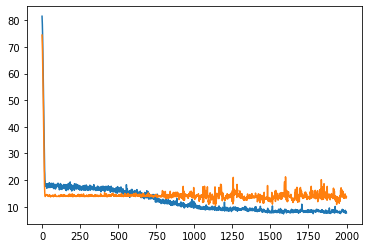

In [18]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [19]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_bilstm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [20]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 12.561299455443336


# Make predictions based on test set and get a root mean squared error 

In [21]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_bilstm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [22]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 18.48182923188131


# Plot train labels along with train predictions

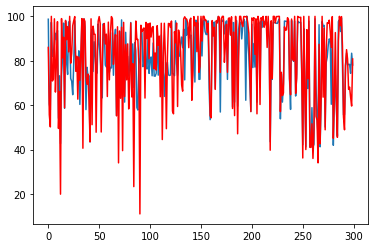

In [23]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

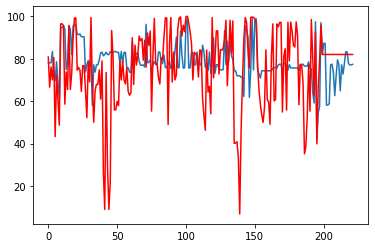

In [24]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [25]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [26]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [27]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [28]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [29]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [30]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [31]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [32]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [33]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [34]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [35]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [36]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [37]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build cnn_bilstm model

In [38]:
cnn_bilstm_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(50, return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(10)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [39]:
from tensorflow import keras

cnn_bilstm_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [40]:
history = cnn_bilstm_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 0.4079 - val_loss: 0.2407
Epoch 2/2000
10/10 - 0s - loss: 0.2731 - val_loss: 0.1769
Epoch 3/2000
10/10 - 0s - loss: 0.2324 - val_loss: 0.1574
Epoch 4/2000
10/10 - 0s - loss: 0.2153 - val_loss: 0.1446
Epoch 5/2000
10/10 - 0s - loss: 0.1947 - val_loss: 0.1434
Epoch 6/2000
10/10 - 0s - loss: 0.1969 - val_loss: 0.1617
Epoch 7/2000
10/10 - 0s - loss: 0.1889 - val_loss: 0.1445
Epoch 8/2000
10/10 - 0s - loss: 0.1864 - val_loss: 0.1689
Epoch 9/2000
10/10 - 0s - loss: 0.1808 - val_loss: 0.1428
Epoch 10/2000
10/10 - 0s - loss: 0.1860 - val_loss: 0.1690
Epoch 11/2000
10/10 - 0s - loss: 0.1771 - val_loss: 0.1633
Epoch 12/2000
10/10 - 0s - loss: 0.1768 - val_loss: 0.1658
Epoch 13/2000
10/10 - 0s - loss: 0.1766 - val_loss: 0.1517
Epoch 14/2000
10/10 - 0s - loss: 0.1640 - val_loss: 0.1486
Epoch 15/2000
10/10 - 0s - loss: 0.1769 - val_loss: 0.1709
Epoch 16/2000
10/10 - 0s - loss: 0.1737 - val_loss: 0.1408
Epoch 17/2000
10/10 - 0s - loss: 0.1691 - val_loss: 0.1667
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.1560
Epoch 141/2000
10/10 - 0s - loss: 0.1139 - val_loss: 0.1624
Epoch 142/2000
10/10 - 0s - loss: 0.1137 - val_loss: 0.1630
Epoch 143/2000
10/10 - 0s - loss: 0.1135 - val_loss: 0.1548
Epoch 144/2000
10/10 - 0s - loss: 0.1183 - val_loss: 0.1530
Epoch 145/2000
10/10 - 0s - loss: 0.1099 - val_loss: 0.1629
Epoch 146/2000
10/10 - 0s - loss: 0.1178 - val_loss: 0.1487
Epoch 147/2000
10/10 - 0s - loss: 0.1066 - val_loss: 0.1609
Epoch 148/2000
10/10 - 0s - loss: 0.1168 - val_loss: 0.1501
Epoch 149/2000
10/10 - 0s - loss: 0.1114 - val_loss: 0.1604
Epoch 150/2000
10/10 - 0s - loss: 0.1117 - val_loss: 0.1493
Epoch 151/2000
10/10 - 0s - loss: 0.1079 - val_loss: 0.1528
Epoch 152/2000
10/10 - 0s - loss: 0.1071 - val_loss: 0.1580
Epoch 153/2000
10/10 - 0s - loss: 0.1096 - val_loss: 0.1532
Epoch 154/2000
10/10 - 0s - loss: 0.1082 - val_loss: 0.1624
Epoch 155/2000
10/10 - 0s - loss: 0.1125 - val_loss: 0.1574
Epoch 156/2000
10/10 - 0s - loss: 0.1067

Epoch 277/2000
10/10 - 0s - loss: 0.0796 - val_loss: 0.1663
Epoch 278/2000
10/10 - 0s - loss: 0.0741 - val_loss: 0.1795
Epoch 279/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1681
Epoch 280/2000
10/10 - 0s - loss: 0.0757 - val_loss: 0.1689
Epoch 281/2000
10/10 - 0s - loss: 0.0796 - val_loss: 0.1638
Epoch 282/2000
10/10 - 0s - loss: 0.0783 - val_loss: 0.1743
Epoch 283/2000
10/10 - 0s - loss: 0.0719 - val_loss: 0.1601
Epoch 284/2000
10/10 - 0s - loss: 0.0754 - val_loss: 0.1668
Epoch 285/2000
10/10 - 0s - loss: 0.0753 - val_loss: 0.1632
Epoch 286/2000
10/10 - 0s - loss: 0.0732 - val_loss: 0.1728
Epoch 287/2000
10/10 - 0s - loss: 0.0733 - val_loss: 0.1686
Epoch 288/2000
10/10 - 0s - loss: 0.0773 - val_loss: 0.1608
Epoch 289/2000
10/10 - 0s - loss: 0.0723 - val_loss: 0.1637
Epoch 290/2000
10/10 - 0s - loss: 0.0743 - val_loss: 0.1668
Epoch 291/2000
10/10 - 0s - loss: 0.0730 - val_loss: 0.1647
Epoch 292/2000
10/10 - 0s - loss: 0.0677 - val_loss: 0.1763
Epoch 293/2000
10/10 - 0s - loss: 0.0689

Epoch 414/2000
10/10 - 0s - loss: 0.0602 - val_loss: 0.1834
Epoch 415/2000
10/10 - 0s - loss: 0.0618 - val_loss: 0.1714
Epoch 416/2000
10/10 - 0s - loss: 0.0626 - val_loss: 0.1821
Epoch 417/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1671
Epoch 418/2000
10/10 - 0s - loss: 0.0648 - val_loss: 0.1853
Epoch 419/2000
10/10 - 0s - loss: 0.0637 - val_loss: 0.1710
Epoch 420/2000
10/10 - 0s - loss: 0.0600 - val_loss: 0.1748
Epoch 421/2000
10/10 - 0s - loss: 0.0604 - val_loss: 0.1742
Epoch 422/2000
10/10 - 0s - loss: 0.0616 - val_loss: 0.1740
Epoch 423/2000
10/10 - 0s - loss: 0.0584 - val_loss: 0.1725
Epoch 424/2000
10/10 - 0s - loss: 0.0674 - val_loss: 0.1734
Epoch 425/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1815
Epoch 426/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1701
Epoch 427/2000
10/10 - 0s - loss: 0.0602 - val_loss: 0.1808
Epoch 428/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1750
Epoch 429/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1781
Epoch 430/2000
10/10 - 0s - loss: 0.0563

Epoch 551/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1742
Epoch 552/2000
10/10 - 0s - loss: 0.0564 - val_loss: 0.1764
Epoch 553/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1752
Epoch 554/2000
10/10 - 0s - loss: 0.0541 - val_loss: 0.1760
Epoch 555/2000
10/10 - 0s - loss: 0.0550 - val_loss: 0.1714
Epoch 556/2000
10/10 - 0s - loss: 0.0553 - val_loss: 0.1764
Epoch 557/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1748
Epoch 558/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1728
Epoch 559/2000
10/10 - 0s - loss: 0.0550 - val_loss: 0.1795
Epoch 560/2000
10/10 - 0s - loss: 0.0573 - val_loss: 0.1732
Epoch 561/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1794
Epoch 562/2000
10/10 - 0s - loss: 0.0541 - val_loss: 0.1703
Epoch 563/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1789
Epoch 564/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1745
Epoch 565/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1769
Epoch 566/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1731
Epoch 567/2000
10/10 - 0s - loss: 0.0544

Epoch 688/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1759
Epoch 689/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1728
Epoch 690/2000
10/10 - 0s - loss: 0.0488 - val_loss: 0.1760
Epoch 691/2000
10/10 - 0s - loss: 0.0493 - val_loss: 0.1737
Epoch 692/2000
10/10 - 0s - loss: 0.0503 - val_loss: 0.1722
Epoch 693/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1754
Epoch 694/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1740
Epoch 695/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1727
Epoch 696/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1707
Epoch 697/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1711
Epoch 698/2000
10/10 - 0s - loss: 0.0500 - val_loss: 0.1722
Epoch 699/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1729
Epoch 700/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1748
Epoch 701/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1732
Epoch 702/2000
10/10 - 0s - loss: 0.0506 - val_loss: 0.1786
Epoch 703/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1739
Epoch 704/2000
10/10 - 0s - loss: 0.0499

Epoch 825/2000
10/10 - 0s - loss: 0.0486 - val_loss: 0.1717
Epoch 826/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1724
Epoch 827/2000
10/10 - 0s - loss: 0.0500 - val_loss: 0.1728
Epoch 828/2000
10/10 - 0s - loss: 0.0498 - val_loss: 0.1674
Epoch 829/2000
10/10 - 0s - loss: 0.0508 - val_loss: 0.1744
Epoch 830/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1690
Epoch 831/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1740
Epoch 832/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1718
Epoch 833/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1706
Epoch 834/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1830
Epoch 835/2000
10/10 - 0s - loss: 0.0509 - val_loss: 0.1734
Epoch 836/2000
10/10 - 0s - loss: 0.0512 - val_loss: 0.1825
Epoch 837/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1695
Epoch 838/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1744
Epoch 839/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1735
Epoch 840/2000
10/10 - 0s - loss: 0.0492 - val_loss: 0.1715
Epoch 841/2000
10/10 - 0s - loss: 0.0499

Epoch 962/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1740
Epoch 963/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1768
Epoch 964/2000
10/10 - 0s - loss: 0.0490 - val_loss: 0.1797
Epoch 965/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1696
Epoch 966/2000
10/10 - 0s - loss: 0.0498 - val_loss: 0.1780
Epoch 967/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1750
Epoch 968/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1759
Epoch 969/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1774
Epoch 970/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1783
Epoch 971/2000
10/10 - 0s - loss: 0.0485 - val_loss: 0.1777
Epoch 972/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1760
Epoch 973/2000
10/10 - 0s - loss: 0.0499 - val_loss: 0.1796
Epoch 974/2000
10/10 - 0s - loss: 0.0478 - val_loss: 0.1795
Epoch 975/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1709
Epoch 976/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1815
Epoch 977/2000
10/10 - 0s - loss: 0.0487 - val_loss: 0.1718
Epoch 978/2000
10/10 - 0s - loss: 0.0466

Epoch 1097/2000
10/10 - 0s - loss: 0.0513 - val_loss: 0.1721
Epoch 1098/2000
10/10 - 0s - loss: 0.0478 - val_loss: 0.1734
Epoch 1099/2000
10/10 - 0s - loss: 0.0489 - val_loss: 0.1757
Epoch 1100/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1783
Epoch 1101/2000
10/10 - 0s - loss: 0.0505 - val_loss: 0.1736
Epoch 1102/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1784
Epoch 1103/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1783
Epoch 1104/2000
10/10 - 0s - loss: 0.0484 - val_loss: 0.1776
Epoch 1105/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1764
Epoch 1106/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1798
Epoch 1107/2000
10/10 - 0s - loss: 0.0461 - val_loss: 0.1714
Epoch 1108/2000
10/10 - 0s - loss: 0.0477 - val_loss: 0.1812
Epoch 1109/2000
10/10 - 0s - loss: 0.0459 - val_loss: 0.1726
Epoch 1110/2000
10/10 - 0s - loss: 0.0468 - val_loss: 0.1753
Epoch 1111/2000
10/10 - 0s - loss: 0.0465 - val_loss: 0.1756
Epoch 1112/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1724
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0436 - val_loss: 0.1752
Epoch 1233/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1730
Epoch 1234/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1701
Epoch 1235/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1732
Epoch 1236/2000
10/10 - 0s - loss: 0.0482 - val_loss: 0.1729
Epoch 1237/2000
10/10 - 0s - loss: 0.0465 - val_loss: 0.1753
Epoch 1238/2000
10/10 - 0s - loss: 0.0466 - val_loss: 0.1725
Epoch 1239/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1775
Epoch 1240/2000
10/10 - 0s - loss: 0.0466 - val_loss: 0.1752
Epoch 1241/2000
10/10 - 0s - loss: 0.0465 - val_loss: 0.1775
Epoch 1242/2000
10/10 - 0s - loss: 0.0466 - val_loss: 0.1743
Epoch 1243/2000
10/10 - 0s - loss: 0.0458 - val_loss: 0.1792
Epoch 1244/2000
10/10 - 0s - loss: 0.0444 - val_loss: 0.1743
Epoch 1245/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1720
Epoch 1246/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1759
Epoch 1247/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1720
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0450 - val_loss: 0.1715
Epoch 1368/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1711
Epoch 1369/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1728
Epoch 1370/2000
10/10 - 0s - loss: 0.0482 - val_loss: 0.1719
Epoch 1371/2000
10/10 - 0s - loss: 0.0447 - val_loss: 0.1691
Epoch 1372/2000
10/10 - 0s - loss: 0.0457 - val_loss: 0.1700
Epoch 1373/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1711
Epoch 1374/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1748
Epoch 1375/2000
10/10 - 0s - loss: 0.0459 - val_loss: 0.1715
Epoch 1376/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1760
Epoch 1377/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1743
Epoch 1378/2000
10/10 - 0s - loss: 0.0439 - val_loss: 0.1757
Epoch 1379/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1783
Epoch 1380/2000
10/10 - 0s - loss: 0.0445 - val_loss: 0.1747
Epoch 1381/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1789
Epoch 1382/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1768
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1739
Epoch 1503/2000
10/10 - 0s - loss: 0.0478 - val_loss: 0.1698
Epoch 1504/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1739
Epoch 1505/2000
10/10 - 0s - loss: 0.0487 - val_loss: 0.1683
Epoch 1506/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1731
Epoch 1507/2000
10/10 - 0s - loss: 0.0467 - val_loss: 0.1703
Epoch 1508/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1785
Epoch 1509/2000
10/10 - 0s - loss: 0.0461 - val_loss: 0.1729
Epoch 1510/2000
10/10 - 0s - loss: 0.0444 - val_loss: 0.1753
Epoch 1511/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1783
Epoch 1512/2000
10/10 - 0s - loss: 0.0458 - val_loss: 0.1684
Epoch 1513/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1792
Epoch 1514/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1721
Epoch 1515/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1761
Epoch 1516/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1721
Epoch 1517/2000
10/10 - 0s - loss: 0.0436 - val_loss: 0.1753
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0431 - val_loss: 0.1755
Epoch 1638/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1717
Epoch 1639/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1803
Epoch 1640/2000
10/10 - 0s - loss: 0.0438 - val_loss: 0.1780
Epoch 1641/2000
10/10 - 0s - loss: 0.0451 - val_loss: 0.1779
Epoch 1642/2000
10/10 - 0s - loss: 0.0444 - val_loss: 0.1762
Epoch 1643/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1803
Epoch 1644/2000
10/10 - 0s - loss: 0.0462 - val_loss: 0.1714
Epoch 1645/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1767
Epoch 1646/2000
10/10 - 0s - loss: 0.0441 - val_loss: 0.1737
Epoch 1647/2000
10/10 - 0s - loss: 0.0452 - val_loss: 0.1746
Epoch 1648/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1748
Epoch 1649/2000
10/10 - 0s - loss: 0.0495 - val_loss: 0.1717
Epoch 1650/2000
10/10 - 0s - loss: 0.0449 - val_loss: 0.1734
Epoch 1651/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1782
Epoch 1652/2000
10/10 - 0s - loss: 0.0427 - val_loss: 0.1717
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0404 - val_loss: 0.1732
Epoch 1773/2000
10/10 - 0s - loss: 0.0440 - val_loss: 0.1760
Epoch 1774/2000
10/10 - 0s - loss: 0.0436 - val_loss: 0.1790
Epoch 1775/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1757
Epoch 1776/2000
10/10 - 0s - loss: 0.0425 - val_loss: 0.1767
Epoch 1777/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1731
Epoch 1778/2000
10/10 - 0s - loss: 0.0450 - val_loss: 0.1806
Epoch 1779/2000
10/10 - 0s - loss: 0.0453 - val_loss: 0.1738
Epoch 1780/2000
10/10 - 0s - loss: 0.0444 - val_loss: 0.1777
Epoch 1781/2000
10/10 - 0s - loss: 0.0424 - val_loss: 0.1736
Epoch 1782/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1763
Epoch 1783/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1702
Epoch 1784/2000
10/10 - 0s - loss: 0.0420 - val_loss: 0.1786
Epoch 1785/2000
10/10 - 0s - loss: 0.0448 - val_loss: 0.1722
Epoch 1786/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1766
Epoch 1787/2000
10/10 - 0s - loss: 0.0429 - val_loss: 0.1734
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1732
Epoch 1908/2000
10/10 - 0s - loss: 0.0443 - val_loss: 0.1797
Epoch 1909/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1705
Epoch 1910/2000
10/10 - 0s - loss: 0.0428 - val_loss: 0.1787
Epoch 1911/2000
10/10 - 0s - loss: 0.0444 - val_loss: 0.1760
Epoch 1912/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1741
Epoch 1913/2000
10/10 - 0s - loss: 0.0416 - val_loss: 0.1753
Epoch 1914/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1735
Epoch 1915/2000
10/10 - 0s - loss: 0.0446 - val_loss: 0.1709
Epoch 1916/2000
10/10 - 0s - loss: 0.0480 - val_loss: 0.1779
Epoch 1917/2000
10/10 - 0s - loss: 0.0468 - val_loss: 0.1691
Epoch 1918/2000
10/10 - 0s - loss: 0.0456 - val_loss: 0.1769
Epoch 1919/2000
10/10 - 0s - loss: 0.0427 - val_loss: 0.1712
Epoch 1920/2000
10/10 - 0s - loss: 0.0442 - val_loss: 0.1718
Epoch 1921/2000
10/10 - 0s - loss: 0.0415 - val_loss: 0.1743
Epoch 1922/2000
10/10 - 0s - loss: 0.0451 - val_loss: 0.1712
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

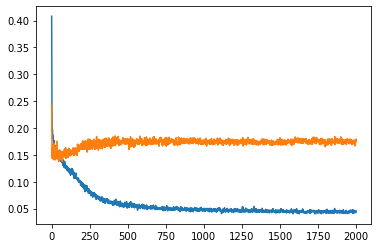

In [41]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [42]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_bilstm_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [43]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.07858816957691192


# Make predictions based on test set and get a root mean squared error 

In [44]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_bilstm_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [45]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.23582182719948114


# Plot train labels along with train predictions

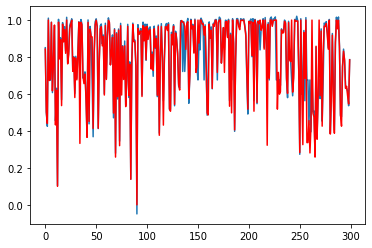

In [46]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

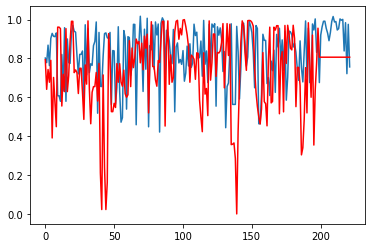

In [47]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [48]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [49]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [50]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [51]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [52]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [53]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [54]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [55]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [56]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [57]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [58]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [59]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [60]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [61]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build cnn_bilstm model

In [62]:
cnn_bilstm_weather_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(50, return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(10)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [63]:
from tensorflow import keras

cnn_bilstm_weather_model.compile(loss='mae', optimizer='adam')

# Train model

In [64]:
history = cnn_bilstm_weather_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 8.9178 - val_loss: 13.5009
Epoch 2/2000
10/10 - 0s - loss: 7.7909 - val_loss: 12.1724
Epoch 3/2000
10/10 - 0s - loss: 6.6801 - val_loss: 10.8044
Epoch 4/2000
10/10 - 0s - loss: 5.7981 - val_loss: 9.8206
Epoch 5/2000
10/10 - 0s - loss: 5.2925 - val_loss: 9.2499
Epoch 6/2000
10/10 - 0s - loss: 5.3207 - val_loss: 9.1466
Epoch 7/2000
10/10 - 0s - loss: 5.3021 - val_loss: 9.2645
Epoch 8/2000
10/10 - 0s - loss: 5.3411 - val_loss: 9.3869
Epoch 9/2000
10/10 - 0s - loss: 5.4059 - val_loss: 9.4352
Epoch 10/2000
10/10 - 0s - loss: 5.3496 - val_loss: 9.5108
Epoch 11/2000
10/10 - 0s - loss: 5.2138 - val_loss: 9.4818
Epoch 12/2000
10/10 - 0s - loss: 5.2748 - val_loss: 9.4542
Epoch 13/2000
10/10 - 0s - loss: 5.3323 - val_loss: 9.5871
Epoch 14/2000
10/10 - 0s - loss: 5.3068 - val_loss: 9.5834
Epoch 15/2000
10/10 - 0s - loss: 5.4272 - val_loss: 9.5279
Epoch 16/2000
10/10 - 0s - loss: 5.2813 - val_loss: 9.7405
Epoch 17/2000
10/10 - 0s - loss: 5.3770 - val_loss: 9.6447
Epo

Epoch 140/2000
10/10 - 0s - loss: 5.2684 - val_loss: 9.6177
Epoch 141/2000
10/10 - 0s - loss: 5.3510 - val_loss: 9.6172
Epoch 142/2000
10/10 - 0s - loss: 5.2515 - val_loss: 9.7669
Epoch 143/2000
10/10 - 0s - loss: 5.2342 - val_loss: 9.7072
Epoch 144/2000
10/10 - 0s - loss: 5.3410 - val_loss: 9.7015
Epoch 145/2000
10/10 - 0s - loss: 5.2623 - val_loss: 9.7667
Epoch 146/2000
10/10 - 0s - loss: 5.3727 - val_loss: 9.7193
Epoch 147/2000
10/10 - 0s - loss: 5.3335 - val_loss: 9.6623
Epoch 148/2000
10/10 - 0s - loss: 5.3809 - val_loss: 9.7679
Epoch 149/2000
10/10 - 0s - loss: 5.3478 - val_loss: 9.8026
Epoch 150/2000
10/10 - 0s - loss: 5.2817 - val_loss: 9.7404
Epoch 151/2000
10/10 - 0s - loss: 5.2959 - val_loss: 9.7233
Epoch 152/2000
10/10 - 0s - loss: 5.3458 - val_loss: 9.7521
Epoch 153/2000
10/10 - 0s - loss: 5.2006 - val_loss: 9.7205
Epoch 154/2000
10/10 - 0s - loss: 5.3134 - val_loss: 9.6723
Epoch 155/2000
10/10 - 0s - loss: 5.2752 - val_loss: 9.6784
Epoch 156/2000
10/10 - 0s - loss: 5.2908

Epoch 277/2000
10/10 - 0s - loss: 5.2711 - val_loss: 9.7361
Epoch 278/2000
10/10 - 0s - loss: 5.2701 - val_loss: 9.7315
Epoch 279/2000
10/10 - 0s - loss: 5.2138 - val_loss: 9.7203
Epoch 280/2000
10/10 - 0s - loss: 5.2655 - val_loss: 9.7762
Epoch 281/2000
10/10 - 0s - loss: 5.3239 - val_loss: 9.8068
Epoch 282/2000
10/10 - 0s - loss: 5.2332 - val_loss: 9.7937
Epoch 283/2000
10/10 - 0s - loss: 5.1891 - val_loss: 9.7760
Epoch 284/2000
10/10 - 0s - loss: 5.1898 - val_loss: 9.7316
Epoch 285/2000
10/10 - 0s - loss: 5.3053 - val_loss: 9.7518
Epoch 286/2000
10/10 - 0s - loss: 5.3367 - val_loss: 9.9006
Epoch 287/2000
10/10 - 0s - loss: 5.2995 - val_loss: 9.9230
Epoch 288/2000
10/10 - 0s - loss: 5.2671 - val_loss: 9.8033
Epoch 289/2000
10/10 - 0s - loss: 5.2651 - val_loss: 9.7549
Epoch 290/2000
10/10 - 0s - loss: 5.1942 - val_loss: 9.7373
Epoch 291/2000
10/10 - 0s - loss: 5.3142 - val_loss: 9.7102
Epoch 292/2000
10/10 - 0s - loss: 5.2829 - val_loss: 9.6652
Epoch 293/2000
10/10 - 0s - loss: 5.3008

Epoch 414/2000
10/10 - 0s - loss: 5.2647 - val_loss: 9.5358
Epoch 415/2000
10/10 - 0s - loss: 5.2948 - val_loss: 9.6332
Epoch 416/2000
10/10 - 0s - loss: 5.2607 - val_loss: 9.7243
Epoch 417/2000
10/10 - 0s - loss: 5.3283 - val_loss: 9.6464
Epoch 418/2000
10/10 - 0s - loss: 5.2818 - val_loss: 9.5177
Epoch 419/2000
10/10 - 0s - loss: 5.2687 - val_loss: 9.5515
Epoch 420/2000
10/10 - 0s - loss: 5.1838 - val_loss: 9.6220
Epoch 421/2000
10/10 - 0s - loss: 5.3853 - val_loss: 9.7158
Epoch 422/2000
10/10 - 0s - loss: 5.2717 - val_loss: 9.7390
Epoch 423/2000
10/10 - 0s - loss: 5.2394 - val_loss: 9.6943
Epoch 424/2000
10/10 - 0s - loss: 5.2026 - val_loss: 9.5902
Epoch 425/2000
10/10 - 0s - loss: 5.1891 - val_loss: 9.6701
Epoch 426/2000
10/10 - 0s - loss: 5.3037 - val_loss: 9.6816
Epoch 427/2000
10/10 - 0s - loss: 5.2551 - val_loss: 9.6830
Epoch 428/2000
10/10 - 0s - loss: 5.2906 - val_loss: 9.6109
Epoch 429/2000
10/10 - 0s - loss: 5.2522 - val_loss: 9.4407
Epoch 430/2000
10/10 - 0s - loss: 5.3135

Epoch 551/2000
10/10 - 0s - loss: 5.2947 - val_loss: 9.6606
Epoch 552/2000
10/10 - 0s - loss: 5.2139 - val_loss: 9.6455
Epoch 553/2000
10/10 - 0s - loss: 5.2971 - val_loss: 9.6453
Epoch 554/2000
10/10 - 0s - loss: 5.2101 - val_loss: 9.7089
Epoch 555/2000
10/10 - 0s - loss: 5.2386 - val_loss: 9.7046
Epoch 556/2000
10/10 - 0s - loss: 5.2057 - val_loss: 9.6597
Epoch 557/2000
10/10 - 0s - loss: 5.2317 - val_loss: 9.6017
Epoch 558/2000
10/10 - 0s - loss: 5.2397 - val_loss: 9.5462
Epoch 559/2000
10/10 - 0s - loss: 5.1686 - val_loss: 9.5621
Epoch 560/2000
10/10 - 0s - loss: 5.2252 - val_loss: 9.5668
Epoch 561/2000
10/10 - 0s - loss: 5.2700 - val_loss: 9.6141
Epoch 562/2000
10/10 - 0s - loss: 5.2271 - val_loss: 9.6074
Epoch 563/2000
10/10 - 0s - loss: 5.2465 - val_loss: 9.6129
Epoch 564/2000
10/10 - 0s - loss: 5.2524 - val_loss: 9.6128
Epoch 565/2000
10/10 - 0s - loss: 5.2911 - val_loss: 9.6484
Epoch 566/2000
10/10 - 0s - loss: 5.2513 - val_loss: 9.6512
Epoch 567/2000
10/10 - 0s - loss: 5.1993

Epoch 688/2000
10/10 - 0s - loss: 5.1561 - val_loss: 9.7723
Epoch 689/2000
10/10 - 0s - loss: 5.2349 - val_loss: 9.7805
Epoch 690/2000
10/10 - 0s - loss: 5.1698 - val_loss: 9.7393
Epoch 691/2000
10/10 - 0s - loss: 5.1703 - val_loss: 9.7224
Epoch 692/2000
10/10 - 0s - loss: 5.1627 - val_loss: 9.7173
Epoch 693/2000
10/10 - 0s - loss: 5.1397 - val_loss: 9.7166
Epoch 694/2000
10/10 - 0s - loss: 5.2721 - val_loss: 9.6589
Epoch 695/2000
10/10 - 0s - loss: 5.1436 - val_loss: 9.5812
Epoch 696/2000
10/10 - 0s - loss: 5.1717 - val_loss: 9.5310
Epoch 697/2000
10/10 - 0s - loss: 5.1649 - val_loss: 9.5553
Epoch 698/2000
10/10 - 0s - loss: 5.1431 - val_loss: 9.5466
Epoch 699/2000
10/10 - 0s - loss: 5.2042 - val_loss: 9.5569
Epoch 700/2000
10/10 - 0s - loss: 5.1680 - val_loss: 9.6198
Epoch 701/2000
10/10 - 0s - loss: 5.1736 - val_loss: 9.6394
Epoch 702/2000
10/10 - 0s - loss: 5.1941 - val_loss: 9.6493
Epoch 703/2000
10/10 - 0s - loss: 5.1522 - val_loss: 9.6450
Epoch 704/2000
10/10 - 0s - loss: 5.2092

Epoch 825/2000
10/10 - 0s - loss: 5.4368 - val_loss: 9.7774
Epoch 826/2000
10/10 - 0s - loss: 5.0714 - val_loss: 9.6791
Epoch 827/2000
10/10 - 0s - loss: 5.2086 - val_loss: 9.7043
Epoch 828/2000
10/10 - 0s - loss: 5.1135 - val_loss: 9.4913
Epoch 829/2000
10/10 - 0s - loss: 5.1330 - val_loss: 9.4601
Epoch 830/2000
10/10 - 0s - loss: 5.0134 - val_loss: 9.2717
Epoch 831/2000
10/10 - 0s - loss: 5.2033 - val_loss: 9.2383
Epoch 832/2000
10/10 - 0s - loss: 5.2995 - val_loss: 9.3170
Epoch 833/2000
10/10 - 0s - loss: 5.1346 - val_loss: 9.3872
Epoch 834/2000
10/10 - 0s - loss: 5.1288 - val_loss: 9.4046
Epoch 835/2000
10/10 - 0s - loss: 5.1243 - val_loss: 9.3203
Epoch 836/2000
10/10 - 0s - loss: 5.1183 - val_loss: 9.4275
Epoch 837/2000
10/10 - 0s - loss: 5.1901 - val_loss: 9.5643
Epoch 838/2000
10/10 - 0s - loss: 5.0882 - val_loss: 9.5630
Epoch 839/2000
10/10 - 0s - loss: 5.0173 - val_loss: 9.3906
Epoch 840/2000
10/10 - 0s - loss: 5.0926 - val_loss: 9.3702
Epoch 841/2000
10/10 - 0s - loss: 5.0579

Epoch 962/2000
10/10 - 0s - loss: 4.9584 - val_loss: 9.5825
Epoch 963/2000
10/10 - 0s - loss: 4.7781 - val_loss: 9.6039
Epoch 964/2000
10/10 - 0s - loss: 4.9319 - val_loss: 9.6212
Epoch 965/2000
10/10 - 0s - loss: 4.7582 - val_loss: 9.6442
Epoch 966/2000
10/10 - 0s - loss: 4.7400 - val_loss: 9.5832
Epoch 967/2000
10/10 - 0s - loss: 4.7076 - val_loss: 9.7886
Epoch 968/2000
10/10 - 0s - loss: 4.9494 - val_loss: 9.5473
Epoch 969/2000
10/10 - 0s - loss: 5.0475 - val_loss: 9.5270
Epoch 970/2000
10/10 - 0s - loss: 4.8450 - val_loss: 9.5319
Epoch 971/2000
10/10 - 0s - loss: 4.9772 - val_loss: 9.4581
Epoch 972/2000
10/10 - 0s - loss: 4.8441 - val_loss: 9.4582
Epoch 973/2000
10/10 - 0s - loss: 4.7809 - val_loss: 9.3625
Epoch 974/2000
10/10 - 0s - loss: 4.8241 - val_loss: 9.4561
Epoch 975/2000
10/10 - 0s - loss: 4.8129 - val_loss: 9.4136
Epoch 976/2000
10/10 - 0s - loss: 4.7335 - val_loss: 8.9354
Epoch 977/2000
10/10 - 0s - loss: 4.9454 - val_loss: 8.8704
Epoch 978/2000
10/10 - 0s - loss: 4.7643

Epoch 1097/2000
10/10 - 0s - loss: 4.1712 - val_loss: 8.6392
Epoch 1098/2000
10/10 - 0s - loss: 4.0675 - val_loss: 9.6144
Epoch 1099/2000
10/10 - 0s - loss: 4.1343 - val_loss: 9.6032
Epoch 1100/2000
10/10 - 0s - loss: 4.4011 - val_loss: 9.5906
Epoch 1101/2000
10/10 - 0s - loss: 3.9525 - val_loss: 8.7641
Epoch 1102/2000
10/10 - 0s - loss: 3.8291 - val_loss: 9.0009
Epoch 1103/2000
10/10 - 0s - loss: 3.8801 - val_loss: 9.3445
Epoch 1104/2000
10/10 - 0s - loss: 3.6254 - val_loss: 8.7861
Epoch 1105/2000
10/10 - 0s - loss: 3.7855 - val_loss: 8.3231
Epoch 1106/2000
10/10 - 0s - loss: 3.8742 - val_loss: 9.3640
Epoch 1107/2000
10/10 - 0s - loss: 3.9428 - val_loss: 10.0387
Epoch 1108/2000
10/10 - 0s - loss: 4.0140 - val_loss: 10.2652
Epoch 1109/2000
10/10 - 0s - loss: 3.9768 - val_loss: 9.3990
Epoch 1110/2000
10/10 - 0s - loss: 3.7548 - val_loss: 9.3779
Epoch 1111/2000
10/10 - 0s - loss: 3.9984 - val_loss: 9.9320
Epoch 1112/2000
10/10 - 0s - loss: 4.1742 - val_loss: 9.1238
Epoch 1113/2000
10/10 

Epoch 1232/2000
10/10 - 0s - loss: 3.9429 - val_loss: 8.6319
Epoch 1233/2000
10/10 - 0s - loss: 3.6569 - val_loss: 8.3774
Epoch 1234/2000
10/10 - 0s - loss: 3.3855 - val_loss: 8.9855
Epoch 1235/2000
10/10 - 0s - loss: 3.9910 - val_loss: 9.3908
Epoch 1236/2000
10/10 - 0s - loss: 3.9237 - val_loss: 8.7736
Epoch 1237/2000
10/10 - 0s - loss: 3.5491 - val_loss: 9.0957
Epoch 1238/2000
10/10 - 0s - loss: 3.5981 - val_loss: 8.9743
Epoch 1239/2000
10/10 - 0s - loss: 3.7797 - val_loss: 8.7937
Epoch 1240/2000
10/10 - 0s - loss: 3.5554 - val_loss: 8.7196
Epoch 1241/2000
10/10 - 0s - loss: 3.6909 - val_loss: 8.7760
Epoch 1242/2000
10/10 - 0s - loss: 3.6396 - val_loss: 8.4904
Epoch 1243/2000
10/10 - 0s - loss: 3.9234 - val_loss: 8.1765
Epoch 1244/2000
10/10 - 0s - loss: 4.6645 - val_loss: 8.2617
Epoch 1245/2000
10/10 - 0s - loss: 4.2973 - val_loss: 9.4080
Epoch 1246/2000
10/10 - 0s - loss: 3.9224 - val_loss: 9.1494
Epoch 1247/2000
10/10 - 0s - loss: 3.8421 - val_loss: 9.4144
Epoch 1248/2000
10/10 - 

Epoch 1366/2000
10/10 - 0s - loss: 3.6777 - val_loss: 8.5898
Epoch 1367/2000
10/10 - 0s - loss: 3.5662 - val_loss: 8.9590
Epoch 1368/2000
10/10 - 0s - loss: 3.6447 - val_loss: 8.9130
Epoch 1369/2000
10/10 - 0s - loss: 3.5235 - val_loss: 8.6245
Epoch 1370/2000
10/10 - 0s - loss: 3.5594 - val_loss: 9.6180
Epoch 1371/2000
10/10 - 0s - loss: 3.6304 - val_loss: 7.4384
Epoch 1372/2000
10/10 - 0s - loss: 3.5922 - val_loss: 6.8797
Epoch 1373/2000
10/10 - 0s - loss: 3.8546 - val_loss: 7.1571
Epoch 1374/2000
10/10 - 0s - loss: 3.4392 - val_loss: 6.0509
Epoch 1375/2000
10/10 - 0s - loss: 4.1777 - val_loss: 7.9165
Epoch 1376/2000
10/10 - 0s - loss: 3.5706 - val_loss: 8.4594
Epoch 1377/2000
10/10 - 0s - loss: 3.6642 - val_loss: 8.7735
Epoch 1378/2000
10/10 - 0s - loss: 3.5737 - val_loss: 9.0349
Epoch 1379/2000
10/10 - 0s - loss: 3.6748 - val_loss: 8.8237
Epoch 1380/2000
10/10 - 0s - loss: 3.8082 - val_loss: 8.4390
Epoch 1381/2000
10/10 - 0s - loss: 3.7632 - val_loss: 9.0529
Epoch 1382/2000
10/10 - 

10/10 - 0s - loss: 4.0022 - val_loss: 9.4958
Epoch 1501/2000
10/10 - 0s - loss: 3.7549 - val_loss: 9.3700
Epoch 1502/2000
10/10 - 0s - loss: 3.7922 - val_loss: 9.2467
Epoch 1503/2000
10/10 - 0s - loss: 3.6960 - val_loss: 9.1396
Epoch 1504/2000
10/10 - 0s - loss: 3.6076 - val_loss: 9.1649
Epoch 1505/2000
10/10 - 0s - loss: 3.7133 - val_loss: 9.3772
Epoch 1506/2000
10/10 - 0s - loss: 3.4358 - val_loss: 9.2653
Epoch 1507/2000
10/10 - 0s - loss: 3.9212 - val_loss: 9.5631
Epoch 1508/2000
10/10 - 0s - loss: 3.6803 - val_loss: 9.4130
Epoch 1509/2000
10/10 - 0s - loss: 3.4592 - val_loss: 8.3556
Epoch 1510/2000
10/10 - 0s - loss: 3.3499 - val_loss: 8.3650
Epoch 1511/2000
10/10 - 0s - loss: 3.5812 - val_loss: 8.8076
Epoch 1512/2000
10/10 - 0s - loss: 3.5462 - val_loss: 8.9213
Epoch 1513/2000
10/10 - 0s - loss: 3.3612 - val_loss: 8.3341
Epoch 1514/2000
10/10 - 0s - loss: 3.6251 - val_loss: 7.9221
Epoch 1515/2000
10/10 - 0s - loss: 3.9717 - val_loss: 8.6953
Epoch 1516/2000
10/10 - 0s - loss: 3.641

Epoch 1635/2000
10/10 - 0s - loss: 3.0687 - val_loss: 7.4441
Epoch 1636/2000
10/10 - 0s - loss: 3.0448 - val_loss: 7.2832
Epoch 1637/2000
10/10 - 0s - loss: 3.1091 - val_loss: 7.7980
Epoch 1638/2000
10/10 - 0s - loss: 3.1498 - val_loss: 9.3593
Epoch 1639/2000
10/10 - 0s - loss: 3.2150 - val_loss: 9.4156
Epoch 1640/2000
10/10 - 0s - loss: 3.0852 - val_loss: 9.0922
Epoch 1641/2000
10/10 - 0s - loss: 3.2215 - val_loss: 9.5930
Epoch 1642/2000
10/10 - 0s - loss: 3.2512 - val_loss: 9.8221
Epoch 1643/2000
10/10 - 0s - loss: 3.2993 - val_loss: 9.6802
Epoch 1644/2000
10/10 - 0s - loss: 3.3311 - val_loss: 9.2603
Epoch 1645/2000
10/10 - 0s - loss: 3.3096 - val_loss: 9.0737
Epoch 1646/2000
10/10 - 0s - loss: 3.3724 - val_loss: 9.3708
Epoch 1647/2000
10/10 - 0s - loss: 3.5696 - val_loss: 9.1887
Epoch 1648/2000
10/10 - 0s - loss: 3.2547 - val_loss: 8.9480
Epoch 1649/2000
10/10 - 0s - loss: 3.4595 - val_loss: 8.5949
Epoch 1650/2000
10/10 - 0s - loss: 3.4400 - val_loss: 8.4107
Epoch 1651/2000
10/10 - 

Epoch 1770/2000
10/10 - 0s - loss: 3.1842 - val_loss: 9.2971
Epoch 1771/2000
10/10 - 0s - loss: 3.2947 - val_loss: 9.1911
Epoch 1772/2000
10/10 - 0s - loss: 3.3106 - val_loss: 9.1474
Epoch 1773/2000
10/10 - 0s - loss: 3.0481 - val_loss: 8.9998
Epoch 1774/2000
10/10 - 0s - loss: 3.2995 - val_loss: 9.1549
Epoch 1775/2000
10/10 - 0s - loss: 3.2493 - val_loss: 9.4277
Epoch 1776/2000
10/10 - 0s - loss: 3.0243 - val_loss: 9.6358
Epoch 1777/2000
10/10 - 0s - loss: 3.2869 - val_loss: 9.7044
Epoch 1778/2000
10/10 - 0s - loss: 3.0495 - val_loss: 9.5129
Epoch 1779/2000
10/10 - 0s - loss: 3.3235 - val_loss: 9.5474
Epoch 1780/2000
10/10 - 0s - loss: 3.3280 - val_loss: 9.7315
Epoch 1781/2000
10/10 - 0s - loss: 3.4792 - val_loss: 9.9103
Epoch 1782/2000
10/10 - 0s - loss: 3.4478 - val_loss: 9.4188
Epoch 1783/2000
10/10 - 0s - loss: 3.1518 - val_loss: 8.9586
Epoch 1784/2000
10/10 - 0s - loss: 3.2157 - val_loss: 8.3039
Epoch 1785/2000
10/10 - 0s - loss: 3.0946 - val_loss: 8.3315
Epoch 1786/2000
10/10 - 

10/10 - 0s - loss: 3.7230 - val_loss: 8.0279
Epoch 1905/2000
10/10 - 0s - loss: 3.4063 - val_loss: 9.3428
Epoch 1906/2000
10/10 - 0s - loss: 3.3349 - val_loss: 9.0048
Epoch 1907/2000
10/10 - 0s - loss: 3.4391 - val_loss: 8.5457
Epoch 1908/2000
10/10 - 0s - loss: 3.5147 - val_loss: 8.8790
Epoch 1909/2000
10/10 - 0s - loss: 3.3094 - val_loss: 8.5316
Epoch 1910/2000
10/10 - 0s - loss: 3.3318 - val_loss: 9.2050
Epoch 1911/2000
10/10 - 0s - loss: 3.1863 - val_loss: 7.2706
Epoch 1912/2000
10/10 - 0s - loss: 3.7747 - val_loss: 8.0687
Epoch 1913/2000
10/10 - 0s - loss: 3.0796 - val_loss: 8.5080
Epoch 1914/2000
10/10 - 0s - loss: 3.1813 - val_loss: 7.9453
Epoch 1915/2000
10/10 - 0s - loss: 3.2880 - val_loss: 6.9453
Epoch 1916/2000
10/10 - 0s - loss: 3.3311 - val_loss: 7.1270
Epoch 1917/2000
10/10 - 0s - loss: 3.5681 - val_loss: 7.4994
Epoch 1918/2000
10/10 - 0s - loss: 3.5763 - val_loss: 6.7874
Epoch 1919/2000
10/10 - 0s - loss: 3.3417 - val_loss: 5.6345
Epoch 1920/2000
10/10 - 0s - loss: 3.199

# Plot model loss and validation loss

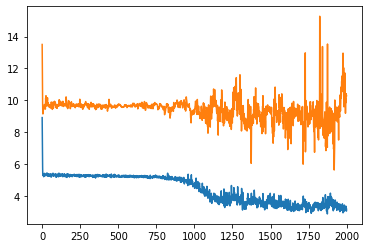

In [65]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [66]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_bilstm_weather_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [67]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 6.909509325284165


# Make predictions based on test set and get a root mean squared error 

In [68]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_bilstm_weather_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [69]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 14.626045288196002


# Plot train labels along with train predictions

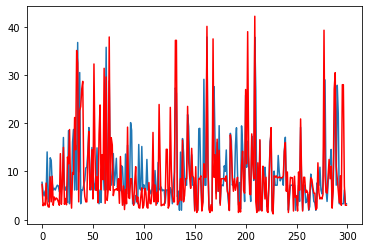

In [70]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

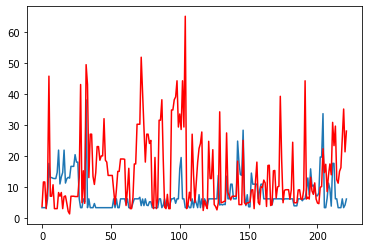

In [71]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [72]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [73]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [74]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [75]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [76]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [77]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [78]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [79]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [80]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [81]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [82]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [83]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [84]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [85]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [86]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build cnn_bilstm model

In [87]:
cnn_bilstm_both_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.Conv1D(filters=64, kernel_size=3, input_shape=(train_X.shape[1],train_X.shape[2])),
    tf.keras.layers.MaxPooling1D(pool_size=2),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(50, return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(10)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [88]:
from tensorflow import keras

cnn_bilstm_both_model.compile(loss='mae', optimizer='adam')

# Train model

In [89]:
history = cnn_bilstm_both_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 0.1829 - val_loss: 0.1501
Epoch 2/2000
10/10 - 0s - loss: 0.1427 - val_loss: 0.1415
Epoch 3/2000
10/10 - 0s - loss: 0.1359 - val_loss: 0.1433
Epoch 4/2000
10/10 - 0s - loss: 0.1297 - val_loss: 0.1392
Epoch 5/2000
10/10 - 0s - loss: 0.1264 - val_loss: 0.1427
Epoch 6/2000
10/10 - 0s - loss: 0.1231 - val_loss: 0.1362
Epoch 7/2000
10/10 - 0s - loss: 0.1273 - val_loss: 0.1375
Epoch 8/2000
10/10 - 0s - loss: 0.1220 - val_loss: 0.1400
Epoch 9/2000
10/10 - 0s - loss: 0.1202 - val_loss: 0.1379
Epoch 10/2000
10/10 - 0s - loss: 0.1164 - val_loss: 0.1375
Epoch 11/2000
10/10 - 0s - loss: 0.1178 - val_loss: 0.1354
Epoch 12/2000
10/10 - 0s - loss: 0.1184 - val_loss: 0.1372
Epoch 13/2000
10/10 - 0s - loss: 0.1177 - val_loss: 0.1401
Epoch 14/2000
10/10 - 0s - loss: 0.1188 - val_loss: 0.1390
Epoch 15/2000
10/10 - 0s - loss: 0.1169 - val_loss: 0.1391
Epoch 16/2000
10/10 - 0s - loss: 0.1177 - val_loss: 0.1409
Epoch 17/2000
10/10 - 0s - loss: 0.1144 - val_loss: 0.1421
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1632
Epoch 141/2000
10/10 - 0s - loss: 0.0744 - val_loss: 0.1488
Epoch 142/2000
10/10 - 0s - loss: 0.0783 - val_loss: 0.1723
Epoch 143/2000
10/10 - 0s - loss: 0.0725 - val_loss: 0.1593
Epoch 144/2000
10/10 - 0s - loss: 0.0772 - val_loss: 0.1519
Epoch 145/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1670
Epoch 146/2000
10/10 - 0s - loss: 0.0779 - val_loss: 0.1562
Epoch 147/2000
10/10 - 0s - loss: 0.0729 - val_loss: 0.1687
Epoch 148/2000
10/10 - 0s - loss: 0.0787 - val_loss: 0.1632
Epoch 149/2000
10/10 - 0s - loss: 0.0736 - val_loss: 0.1582
Epoch 150/2000
10/10 - 0s - loss: 0.0723 - val_loss: 0.1541
Epoch 151/2000
10/10 - 0s - loss: 0.0691 - val_loss: 0.1617
Epoch 152/2000
10/10 - 0s - loss: 0.0701 - val_loss: 0.1609
Epoch 153/2000
10/10 - 0s - loss: 0.0688 - val_loss: 0.1611
Epoch 154/2000
10/10 - 0s - loss: 0.0682 - val_loss: 0.1590
Epoch 155/2000
10/10 - 0s - loss: 0.0703 - val_loss: 0.1596
Epoch 156/2000
10/10 - 0s - loss: 0.0657

Epoch 277/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1603
Epoch 278/2000
10/10 - 0s - loss: 0.0546 - val_loss: 0.1544
Epoch 279/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1601
Epoch 280/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1630
Epoch 281/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1629
Epoch 282/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1574
Epoch 283/2000
10/10 - 0s - loss: 0.0494 - val_loss: 0.1630
Epoch 284/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1549
Epoch 285/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1662
Epoch 286/2000
10/10 - 0s - loss: 0.0502 - val_loss: 0.1639
Epoch 287/2000
10/10 - 0s - loss: 0.0479 - val_loss: 0.1631
Epoch 288/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1603
Epoch 289/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1699
Epoch 290/2000
10/10 - 0s - loss: 0.0488 - val_loss: 0.1694
Epoch 291/2000
10/10 - 0s - loss: 0.0540 - val_loss: 0.1667
Epoch 292/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1568
Epoch 293/2000
10/10 - 0s - loss: 0.0491

Epoch 414/2000
10/10 - 0s - loss: 0.0419 - val_loss: 0.1688
Epoch 415/2000
10/10 - 0s - loss: 0.0423 - val_loss: 0.1670
Epoch 416/2000
10/10 - 0s - loss: 0.0422 - val_loss: 0.1614
Epoch 417/2000
10/10 - 0s - loss: 0.0412 - val_loss: 0.1594
Epoch 418/2000
10/10 - 0s - loss: 0.0407 - val_loss: 0.1619
Epoch 419/2000
10/10 - 0s - loss: 0.0383 - val_loss: 0.1707
Epoch 420/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1667
Epoch 421/2000
10/10 - 0s - loss: 0.0421 - val_loss: 0.1673
Epoch 422/2000
10/10 - 0s - loss: 0.0433 - val_loss: 0.1640
Epoch 423/2000
10/10 - 0s - loss: 0.0401 - val_loss: 0.1613
Epoch 424/2000
10/10 - 0s - loss: 0.0392 - val_loss: 0.1659
Epoch 425/2000
10/10 - 0s - loss: 0.0406 - val_loss: 0.1653
Epoch 426/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1585
Epoch 427/2000
10/10 - 0s - loss: 0.0403 - val_loss: 0.1693
Epoch 428/2000
10/10 - 0s - loss: 0.0418 - val_loss: 0.1597
Epoch 429/2000
10/10 - 0s - loss: 0.0422 - val_loss: 0.1664
Epoch 430/2000
10/10 - 0s - loss: 0.0402

Epoch 551/2000
10/10 - 0s - loss: 0.0383 - val_loss: 0.1561
Epoch 552/2000
10/10 - 0s - loss: 0.0360 - val_loss: 0.1583
Epoch 553/2000
10/10 - 0s - loss: 0.0399 - val_loss: 0.1622
Epoch 554/2000
10/10 - 0s - loss: 0.0388 - val_loss: 0.1571
Epoch 555/2000
10/10 - 0s - loss: 0.0367 - val_loss: 0.1541
Epoch 556/2000
10/10 - 0s - loss: 0.0356 - val_loss: 0.1609
Epoch 557/2000
10/10 - 0s - loss: 0.0403 - val_loss: 0.1502
Epoch 558/2000
10/10 - 0s - loss: 0.0360 - val_loss: 0.1589
Epoch 559/2000
10/10 - 0s - loss: 0.0341 - val_loss: 0.1549
Epoch 560/2000
10/10 - 0s - loss: 0.0331 - val_loss: 0.1536
Epoch 561/2000
10/10 - 0s - loss: 0.0366 - val_loss: 0.1591
Epoch 562/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1561
Epoch 563/2000
10/10 - 0s - loss: 0.0375 - val_loss: 0.1519
Epoch 564/2000
10/10 - 0s - loss: 0.0383 - val_loss: 0.1640
Epoch 565/2000
10/10 - 0s - loss: 0.0375 - val_loss: 0.1606
Epoch 566/2000
10/10 - 0s - loss: 0.0364 - val_loss: 0.1595
Epoch 567/2000
10/10 - 0s - loss: 0.0359

Epoch 688/2000
10/10 - 0s - loss: 0.0335 - val_loss: 0.1532
Epoch 689/2000
10/10 - 0s - loss: 0.0372 - val_loss: 0.1530
Epoch 690/2000
10/10 - 0s - loss: 0.0341 - val_loss: 0.1522
Epoch 691/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1560
Epoch 692/2000
10/10 - 0s - loss: 0.0309 - val_loss: 0.1546
Epoch 693/2000
10/10 - 0s - loss: 0.0325 - val_loss: 0.1534
Epoch 694/2000
10/10 - 0s - loss: 0.0365 - val_loss: 0.1533
Epoch 695/2000
10/10 - 0s - loss: 0.0367 - val_loss: 0.1582
Epoch 696/2000
10/10 - 0s - loss: 0.0368 - val_loss: 0.1541
Epoch 697/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1576
Epoch 698/2000
10/10 - 0s - loss: 0.0361 - val_loss: 0.1509
Epoch 699/2000
10/10 - 0s - loss: 0.0361 - val_loss: 0.1600
Epoch 700/2000
10/10 - 0s - loss: 0.0376 - val_loss: 0.1529
Epoch 701/2000
10/10 - 0s - loss: 0.0343 - val_loss: 0.1589
Epoch 702/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1586
Epoch 703/2000
10/10 - 0s - loss: 0.0332 - val_loss: 0.1560
Epoch 704/2000
10/10 - 0s - loss: 0.0319

Epoch 825/2000
10/10 - 0s - loss: 0.0323 - val_loss: 0.1477
Epoch 826/2000
10/10 - 0s - loss: 0.0309 - val_loss: 0.1548
Epoch 827/2000
10/10 - 0s - loss: 0.0304 - val_loss: 0.1542
Epoch 828/2000
10/10 - 0s - loss: 0.0318 - val_loss: 0.1542
Epoch 829/2000
10/10 - 0s - loss: 0.0336 - val_loss: 0.1519
Epoch 830/2000
10/10 - 0s - loss: 0.0357 - val_loss: 0.1514
Epoch 831/2000
10/10 - 0s - loss: 0.0336 - val_loss: 0.1516
Epoch 832/2000
10/10 - 0s - loss: 0.0308 - val_loss: 0.1542
Epoch 833/2000
10/10 - 0s - loss: 0.0333 - val_loss: 0.1487
Epoch 834/2000
10/10 - 0s - loss: 0.0312 - val_loss: 0.1489
Epoch 835/2000
10/10 - 0s - loss: 0.0342 - val_loss: 0.1500
Epoch 836/2000
10/10 - 0s - loss: 0.0329 - val_loss: 0.1485
Epoch 837/2000
10/10 - 0s - loss: 0.0344 - val_loss: 0.1502
Epoch 838/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1497
Epoch 839/2000
10/10 - 0s - loss: 0.0313 - val_loss: 0.1524
Epoch 840/2000
10/10 - 0s - loss: 0.0306 - val_loss: 0.1503
Epoch 841/2000
10/10 - 0s - loss: 0.0318

Epoch 962/2000
10/10 - 0s - loss: 0.0310 - val_loss: 0.1594
Epoch 963/2000
10/10 - 0s - loss: 0.0276 - val_loss: 0.1535
Epoch 964/2000
10/10 - 0s - loss: 0.0305 - val_loss: 0.1536
Epoch 965/2000
10/10 - 0s - loss: 0.0313 - val_loss: 0.1530
Epoch 966/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1526
Epoch 967/2000
10/10 - 0s - loss: 0.0312 - val_loss: 0.1559
Epoch 968/2000
10/10 - 0s - loss: 0.0300 - val_loss: 0.1519
Epoch 969/2000
10/10 - 0s - loss: 0.0315 - val_loss: 0.1495
Epoch 970/2000
10/10 - 0s - loss: 0.0303 - val_loss: 0.1566
Epoch 971/2000
10/10 - 0s - loss: 0.0325 - val_loss: 0.1519
Epoch 972/2000
10/10 - 0s - loss: 0.0333 - val_loss: 0.1602
Epoch 973/2000
10/10 - 0s - loss: 0.0300 - val_loss: 0.1495
Epoch 974/2000
10/10 - 0s - loss: 0.0330 - val_loss: 0.1587
Epoch 975/2000
10/10 - 0s - loss: 0.0315 - val_loss: 0.1511
Epoch 976/2000
10/10 - 0s - loss: 0.0316 - val_loss: 0.1541
Epoch 977/2000
10/10 - 0s - loss: 0.0305 - val_loss: 0.1519
Epoch 978/2000
10/10 - 0s - loss: 0.0340

Epoch 1097/2000
10/10 - 0s - loss: 0.0329 - val_loss: 0.1497
Epoch 1098/2000
10/10 - 0s - loss: 0.0330 - val_loss: 0.1511
Epoch 1099/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1485
Epoch 1100/2000
10/10 - 0s - loss: 0.0300 - val_loss: 0.1488
Epoch 1101/2000
10/10 - 0s - loss: 0.0309 - val_loss: 0.1486
Epoch 1102/2000
10/10 - 0s - loss: 0.0280 - val_loss: 0.1478
Epoch 1103/2000
10/10 - 0s - loss: 0.0314 - val_loss: 0.1518
Epoch 1104/2000
10/10 - 0s - loss: 0.0283 - val_loss: 0.1550
Epoch 1105/2000
10/10 - 0s - loss: 0.0278 - val_loss: 0.1536
Epoch 1106/2000
10/10 - 0s - loss: 0.0297 - val_loss: 0.1472
Epoch 1107/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1522
Epoch 1108/2000
10/10 - 0s - loss: 0.0333 - val_loss: 0.1497
Epoch 1109/2000
10/10 - 0s - loss: 0.0328 - val_loss: 0.1519
Epoch 1110/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1498
Epoch 1111/2000
10/10 - 0s - loss: 0.0314 - val_loss: 0.1464
Epoch 1112/2000
10/10 - 0s - loss: 0.0303 - val_loss: 0.1480
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0277 - val_loss: 0.1506
Epoch 1233/2000
10/10 - 0s - loss: 0.0300 - val_loss: 0.1533
Epoch 1234/2000
10/10 - 0s - loss: 0.0304 - val_loss: 0.1485
Epoch 1235/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1541
Epoch 1236/2000
10/10 - 0s - loss: 0.0328 - val_loss: 0.1497
Epoch 1237/2000
10/10 - 0s - loss: 0.0316 - val_loss: 0.1482
Epoch 1238/2000
10/10 - 0s - loss: 0.0303 - val_loss: 0.1568
Epoch 1239/2000
10/10 - 0s - loss: 0.0329 - val_loss: 0.1456
Epoch 1240/2000
10/10 - 0s - loss: 0.0307 - val_loss: 0.1552
Epoch 1241/2000
10/10 - 0s - loss: 0.0292 - val_loss: 0.1523
Epoch 1242/2000
10/10 - 0s - loss: 0.0330 - val_loss: 0.1523
Epoch 1243/2000
10/10 - 0s - loss: 0.0289 - val_loss: 0.1498
Epoch 1244/2000
10/10 - 0s - loss: 0.0317 - val_loss: 0.1509
Epoch 1245/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1477
Epoch 1246/2000
10/10 - 0s - loss: 0.0307 - val_loss: 0.1564
Epoch 1247/2000
10/10 - 0s - loss: 0.0310 - val_loss: 0.1492
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0285 - val_loss: 0.1498
Epoch 1368/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1513
Epoch 1369/2000
10/10 - 0s - loss: 0.0293 - val_loss: 0.1497
Epoch 1370/2000
10/10 - 0s - loss: 0.0293 - val_loss: 0.1489
Epoch 1371/2000
10/10 - 0s - loss: 0.0277 - val_loss: 0.1515
Epoch 1372/2000
10/10 - 0s - loss: 0.0285 - val_loss: 0.1504
Epoch 1373/2000
10/10 - 0s - loss: 0.0284 - val_loss: 0.1474
Epoch 1374/2000
10/10 - 0s - loss: 0.0294 - val_loss: 0.1509
Epoch 1375/2000
10/10 - 0s - loss: 0.0288 - val_loss: 0.1492
Epoch 1376/2000
10/10 - 0s - loss: 0.0283 - val_loss: 0.1492
Epoch 1377/2000
10/10 - 0s - loss: 0.0301 - val_loss: 0.1512
Epoch 1378/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1486
Epoch 1379/2000
10/10 - 0s - loss: 0.0291 - val_loss: 0.1536
Epoch 1380/2000
10/10 - 0s - loss: 0.0319 - val_loss: 0.1495
Epoch 1381/2000
10/10 - 0s - loss: 0.0316 - val_loss: 0.1525
Epoch 1382/2000
10/10 - 0s - loss: 0.0285 - val_loss: 0.1534
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0307 - val_loss: 0.1525
Epoch 1503/2000
10/10 - 0s - loss: 0.0300 - val_loss: 0.1514
Epoch 1504/2000
10/10 - 0s - loss: 0.0277 - val_loss: 0.1519
Epoch 1505/2000
10/10 - 0s - loss: 0.0289 - val_loss: 0.1521
Epoch 1506/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1505
Epoch 1507/2000
10/10 - 0s - loss: 0.0314 - val_loss: 0.1495
Epoch 1508/2000
10/10 - 0s - loss: 0.0265 - val_loss: 0.1535
Epoch 1509/2000
10/10 - 0s - loss: 0.0254 - val_loss: 0.1521
Epoch 1510/2000
10/10 - 0s - loss: 0.0272 - val_loss: 0.1501
Epoch 1511/2000
10/10 - 0s - loss: 0.0295 - val_loss: 0.1477
Epoch 1512/2000
10/10 - 0s - loss: 0.0289 - val_loss: 0.1500
Epoch 1513/2000
10/10 - 0s - loss: 0.0276 - val_loss: 0.1523
Epoch 1514/2000
10/10 - 0s - loss: 0.0313 - val_loss: 0.1505
Epoch 1515/2000
10/10 - 0s - loss: 0.0268 - val_loss: 0.1541
Epoch 1516/2000
10/10 - 0s - loss: 0.0266 - val_loss: 0.1555
Epoch 1517/2000
10/10 - 0s - loss: 0.0278 - val_loss: 0.1509
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0295 - val_loss: 0.1541
Epoch 1638/2000
10/10 - 0s - loss: 0.0295 - val_loss: 0.1547
Epoch 1639/2000
10/10 - 0s - loss: 0.0297 - val_loss: 0.1513
Epoch 1640/2000
10/10 - 0s - loss: 0.0292 - val_loss: 0.1496
Epoch 1641/2000
10/10 - 0s - loss: 0.0304 - val_loss: 0.1525
Epoch 1642/2000
10/10 - 0s - loss: 0.0307 - val_loss: 0.1491
Epoch 1643/2000
10/10 - 0s - loss: 0.0298 - val_loss: 0.1481
Epoch 1644/2000
10/10 - 0s - loss: 0.0299 - val_loss: 0.1536
Epoch 1645/2000
10/10 - 0s - loss: 0.0275 - val_loss: 0.1509
Epoch 1646/2000
10/10 - 0s - loss: 0.0283 - val_loss: 0.1507
Epoch 1647/2000
10/10 - 0s - loss: 0.0287 - val_loss: 0.1537
Epoch 1648/2000
10/10 - 0s - loss: 0.0304 - val_loss: 0.1500
Epoch 1649/2000
10/10 - 0s - loss: 0.0301 - val_loss: 0.1494
Epoch 1650/2000
10/10 - 0s - loss: 0.0280 - val_loss: 0.1523
Epoch 1651/2000
10/10 - 0s - loss: 0.0283 - val_loss: 0.1497
Epoch 1652/2000
10/10 - 0s - loss: 0.0291 - val_loss: 0.1502
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0279 - val_loss: 0.1566
Epoch 1773/2000
10/10 - 0s - loss: 0.0259 - val_loss: 0.1545
Epoch 1774/2000
10/10 - 0s - loss: 0.0274 - val_loss: 0.1538
Epoch 1775/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1535
Epoch 1776/2000
10/10 - 0s - loss: 0.0282 - val_loss: 0.1534
Epoch 1777/2000
10/10 - 0s - loss: 0.0287 - val_loss: 0.1533
Epoch 1778/2000
10/10 - 0s - loss: 0.0269 - val_loss: 0.1560
Epoch 1779/2000
10/10 - 0s - loss: 0.0276 - val_loss: 0.1528
Epoch 1780/2000
10/10 - 0s - loss: 0.0264 - val_loss: 0.1494
Epoch 1781/2000
10/10 - 0s - loss: 0.0282 - val_loss: 0.1532
Epoch 1782/2000
10/10 - 0s - loss: 0.0302 - val_loss: 0.1523
Epoch 1783/2000
10/10 - 0s - loss: 0.0273 - val_loss: 0.1526
Epoch 1784/2000
10/10 - 0s - loss: 0.0281 - val_loss: 0.1536
Epoch 1785/2000
10/10 - 0s - loss: 0.0284 - val_loss: 0.1483
Epoch 1786/2000
10/10 - 0s - loss: 0.0301 - val_loss: 0.1502
Epoch 1787/2000
10/10 - 0s - loss: 0.0278 - val_loss: 0.1542
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0260 - val_loss: 0.1537
Epoch 1908/2000
10/10 - 0s - loss: 0.0277 - val_loss: 0.1551
Epoch 1909/2000
10/10 - 0s - loss: 0.0280 - val_loss: 0.1552
Epoch 1910/2000
10/10 - 0s - loss: 0.0281 - val_loss: 0.1530
Epoch 1911/2000
10/10 - 0s - loss: 0.0276 - val_loss: 0.1512
Epoch 1912/2000
10/10 - 0s - loss: 0.0271 - val_loss: 0.1532
Epoch 1913/2000
10/10 - 0s - loss: 0.0291 - val_loss: 0.1537
Epoch 1914/2000
10/10 - 0s - loss: 0.0287 - val_loss: 0.1533
Epoch 1915/2000
10/10 - 0s - loss: 0.0257 - val_loss: 0.1553
Epoch 1916/2000
10/10 - 0s - loss: 0.0266 - val_loss: 0.1523
Epoch 1917/2000
10/10 - 0s - loss: 0.0279 - val_loss: 0.1497
Epoch 1918/2000
10/10 - 0s - loss: 0.0279 - val_loss: 0.1496
Epoch 1919/2000
10/10 - 0s - loss: 0.0277 - val_loss: 0.1510
Epoch 1920/2000
10/10 - 0s - loss: 0.0287 - val_loss: 0.1528
Epoch 1921/2000
10/10 - 0s - loss: 0.0281 - val_loss: 0.1526
Epoch 1922/2000
10/10 - 0s - loss: 0.0283 - val_loss: 0.1559
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

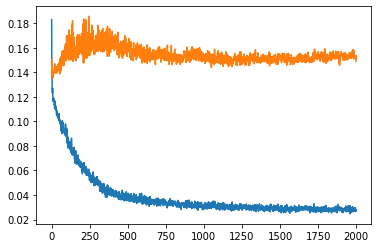

In [90]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [91]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = cnn_bilstm_both_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [92]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.05477966918564754


# Make predictions based on test set and get a root mean squared error 

In [93]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = cnn_bilstm_both_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [94]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.21632517001046248


# Plot train labels along with train predictions

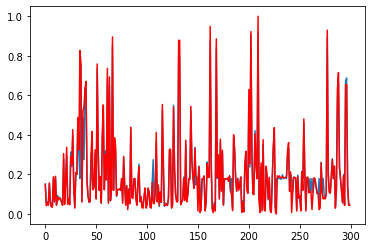

In [95]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

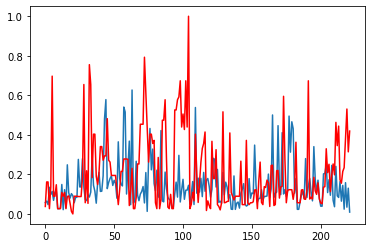

In [96]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()